In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

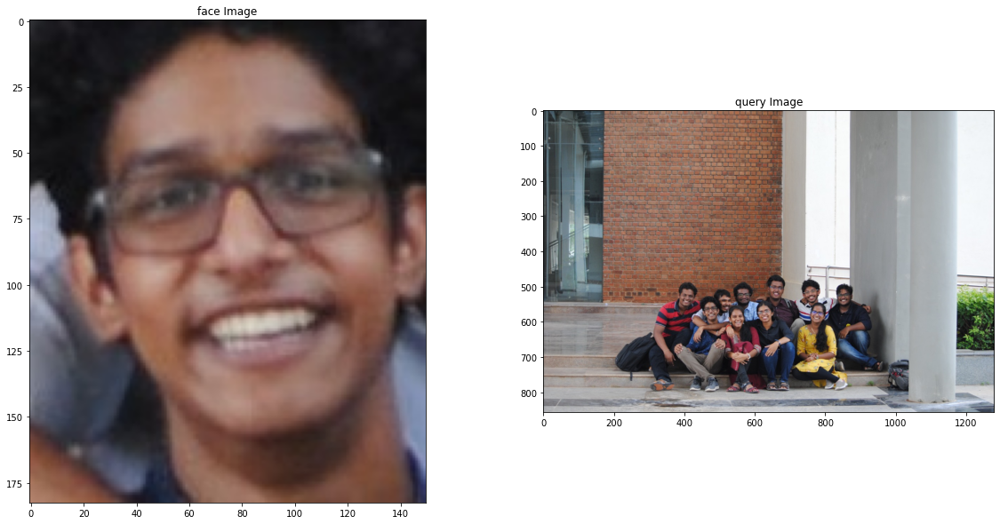

In [5]:
# Load the image
image = cv2.imread('images/subs.jpeg')
face = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
face_gray = cv2.cvtColor(face, cv2.COLOR_RGB2GRAY)

query = cv2.imread('images/grp1.jpeg')
query = cv2.cvtColor(query, cv2.COLOR_BGR2RGB)
query_gray = cv2.cvtColor(query, cv2.COLOR_RGB2GRAY)

fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("face Image")
plots[0].imshow(face)

plots[1].set_title("query Image")
plots[1].imshow(query)

Number of Keypoints Detected In The Training Image:  124
Number of Keypoints Detected In The Query Image:  4287


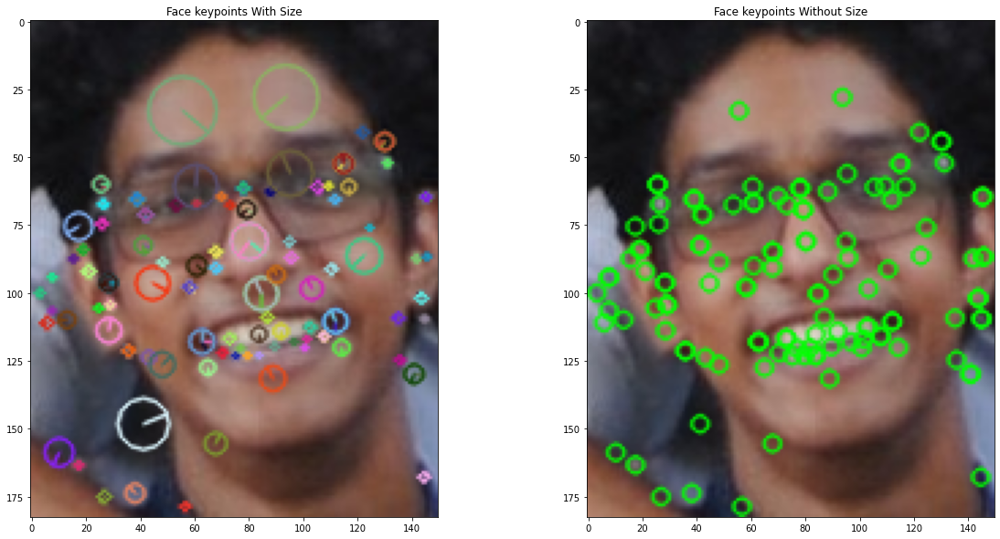

In [7]:
sift = cv2.SIFT_create()

face_keypoints, face_descriptor = sift.detectAndCompute(face_gray, None)
query_keypoints, query_descriptor = sift.detectAndCompute(query_gray, None)

keypoints_without_size = np.copy(face)
keypoints_with_size = np.copy(face)

cv2.drawKeypoints(face, face_keypoints, keypoints_without_size, color = (0, 255, 0))
cv2.drawKeypoints(face, face_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Face keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Face keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

print("Number of Keypoints Detected In The Training Image: ", len(face_keypoints))

print("Number of Keypoints Detected In The Query Image: ", len(query_keypoints))

In [9]:
bf = cv2.BFMatcher()
matches=bf.knnMatch(face_descriptor,query_descriptor,k=2)
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

In [10]:
print(len(matches))
print(len(good))

124
18


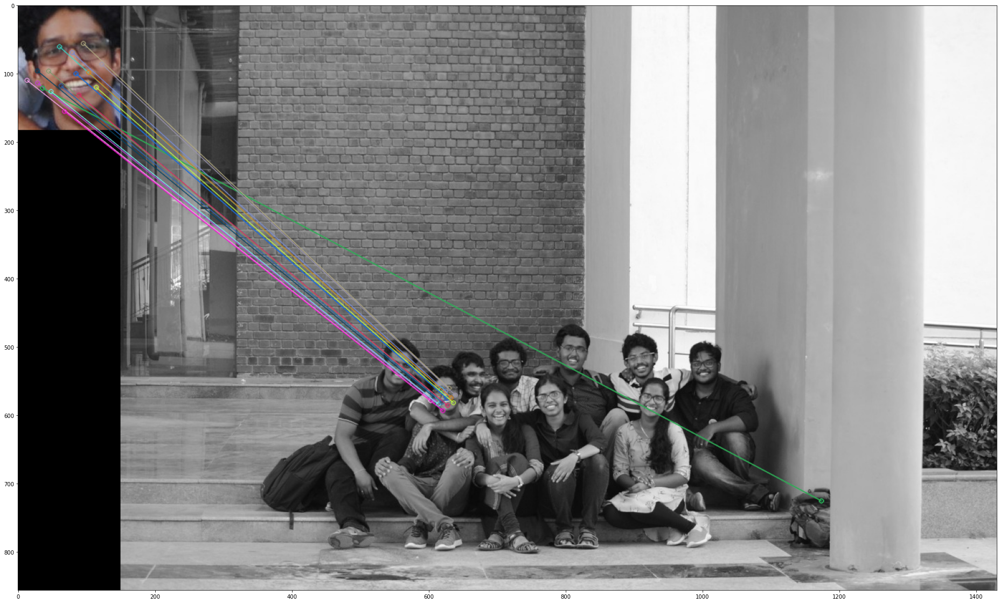

In [11]:
img3 = cv2.drawMatchesKnn(face,face_keypoints,query_gray,query_keypoints,good,query_gray,flags=2)

plt.figure(figsize=(40,20))
plt.imshow(img3)
plt.show()

In [12]:
def face_recog_sift(query_image, face_image):
    image1 = cv2.imread('images/'+face_image)
    training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

    test_image = cv2.imread('images/'+query_image)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create()

    train_keypoints, train_descriptor = sift.detectAndCompute(training_gray, None)
    test_keypoints, test_descriptor = sift.detectAndCompute(test_gray, None)

    keypoints_without_size = np.copy(training_image)
    keypoints_with_size = np.copy(training_image)

    cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))
    cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))
    print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))
    
    bf = cv2.BFMatcher()
    matches=bf.knnMatch(train_descriptor,test_descriptor,k=2)
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])
            
    img3 = cv2.drawMatchesKnn(training_image,train_keypoints,test_gray,test_keypoints,good,test_gray,flags=2)

    plt.figure(figsize=(40,20))
    plt.imshow(img3)
    plt.show()
    

In [13]:
def _face_recog_sift(query_image, face_image):
    image1 = cv2.imread('images/'+face_image)
    train_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    train_gray = cv2.cvtColor(train_image, cv2.COLOR_RGB2GRAY)

    test_image = cv2.imread('images/'+query_image)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create()

    train_keypoints, train_descriptor = sift.detectAndCompute(train_gray, None)
    test_keypoints, test_descriptor = sift.detectAndCompute(test_gray, None)

    bf = cv2.BFMatcher()
    matches=bf.knnMatch(train_descriptor,test_descriptor,k=2)
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])
    return len(good)

In [14]:
def recog(query_image,face1,face2):
    fig = plt.figure(figsize=(10, 7))
    rows = 1
    columns = 3
    
    query = cv2.cvtColor(cv2.imread('images/'+query_image), cv2.COLOR_BGR2RGB)
    f1 = cv2.cvtColor(cv2.imread('images/'+face1), cv2.COLOR_BGR2RGB)
    f2 = cv2.cvtColor(cv2.imread('images/'+face2), cv2.COLOR_BGR2RGB)
    fig.add_subplot(rows, columns, 1)
  
    plt.imshow(query)
    plt.axis('off')
    plt.title("Query image")
  
    fig.add_subplot(rows, columns, 2)

    plt.imshow(f1)
    plt.axis('off')
    plt.title("Face 1")
    
    fig.add_subplot(rows, columns, 3)

    plt.imshow(f2)
    plt.axis('off')
    plt.title("Face 2")
    
    if _face_recog_sift(query_image, face2) > _face_recog_sift(query_image, face1):
        face_recog_sift(query_image, face2)
    
    else:
        face_recog_sift(query_image, face1)
   

Number of Keypoints Detected In The Training Image:  1179
Number of Keypoints Detected In The Query Image:  1608


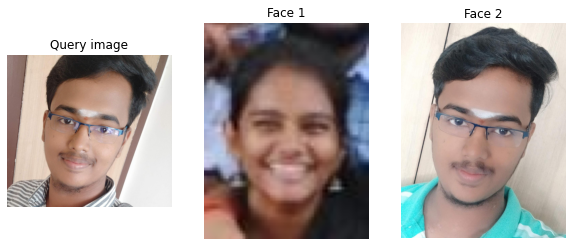

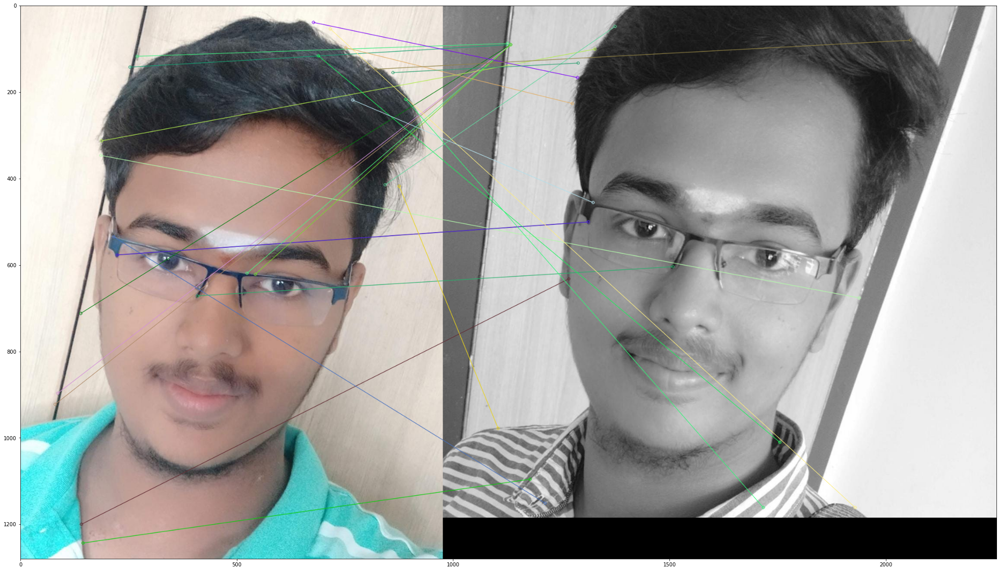

In [15]:
recog('harish3.jpeg','sindu2.jpeg','harish2.jpeg')

Number of Keypoints Detected In The Training Image:  1085
Number of Keypoints Detected In The Query Image:  60


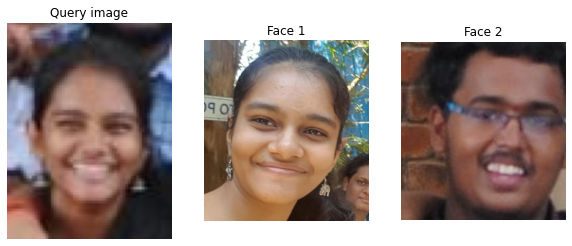

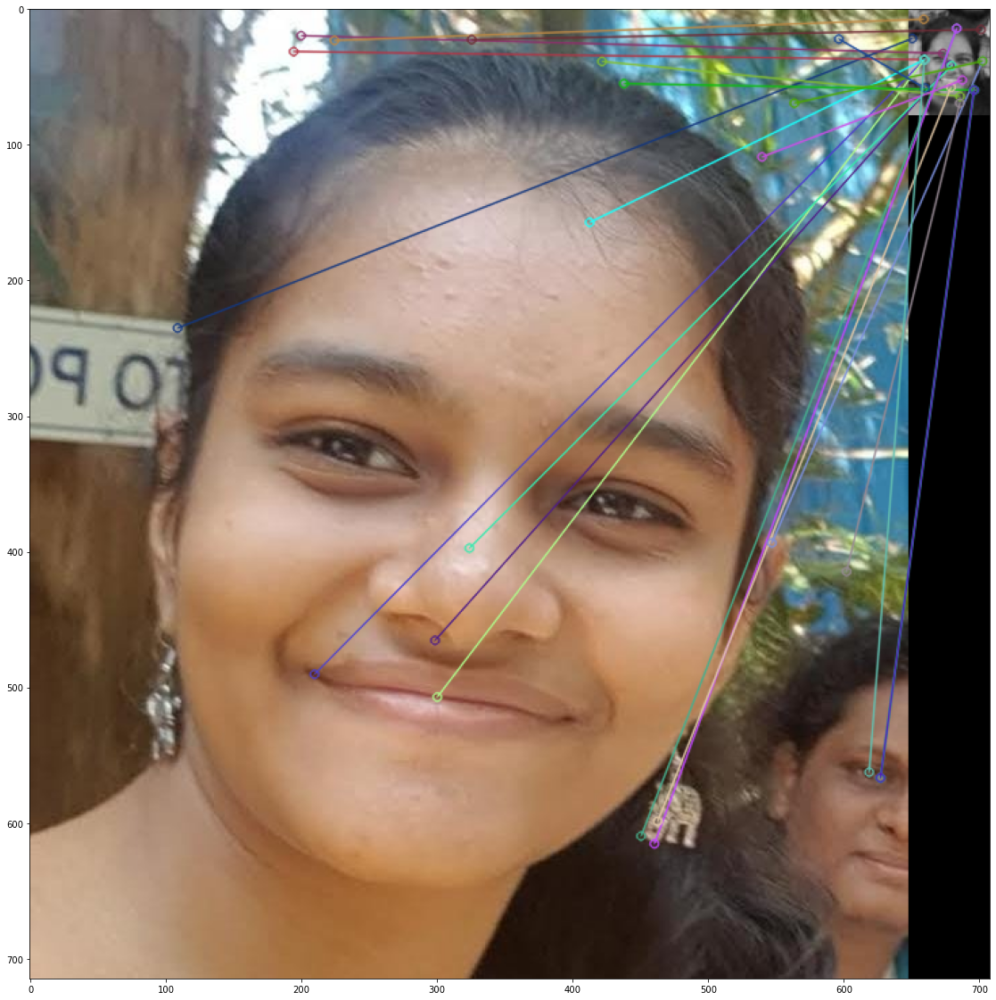

In [16]:
recog('sindu2.jpeg','sindu3.jpeg','harish.jpeg')

Number of Keypoints Detected In The Training Image:  60
Number of Keypoints Detected In The Query Image:  1808


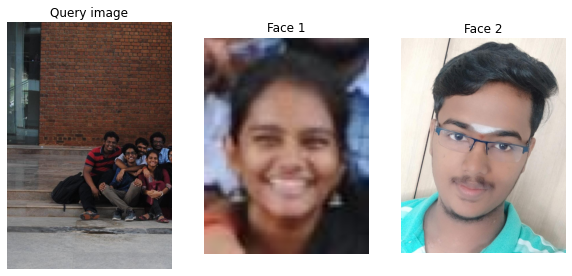

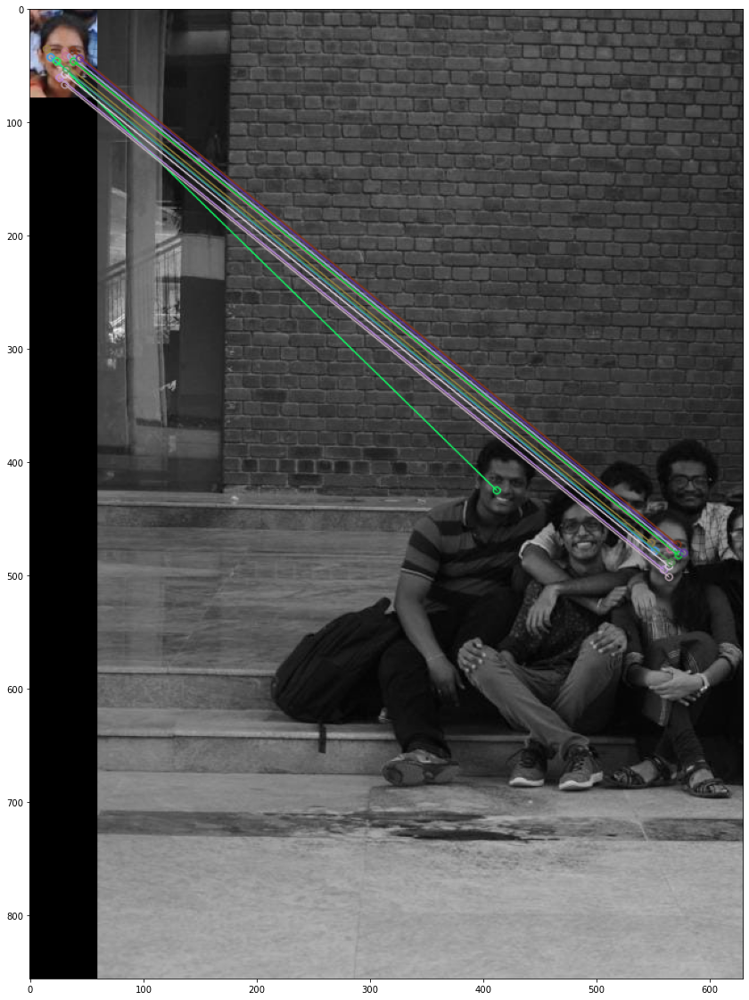

In [17]:
recog('half-grp1.jpeg','sindu2.jpeg','harish2.jpeg')

Number of Keypoints Detected In The Training Image:  124
Number of Keypoints Detected In The Query Image:  4396


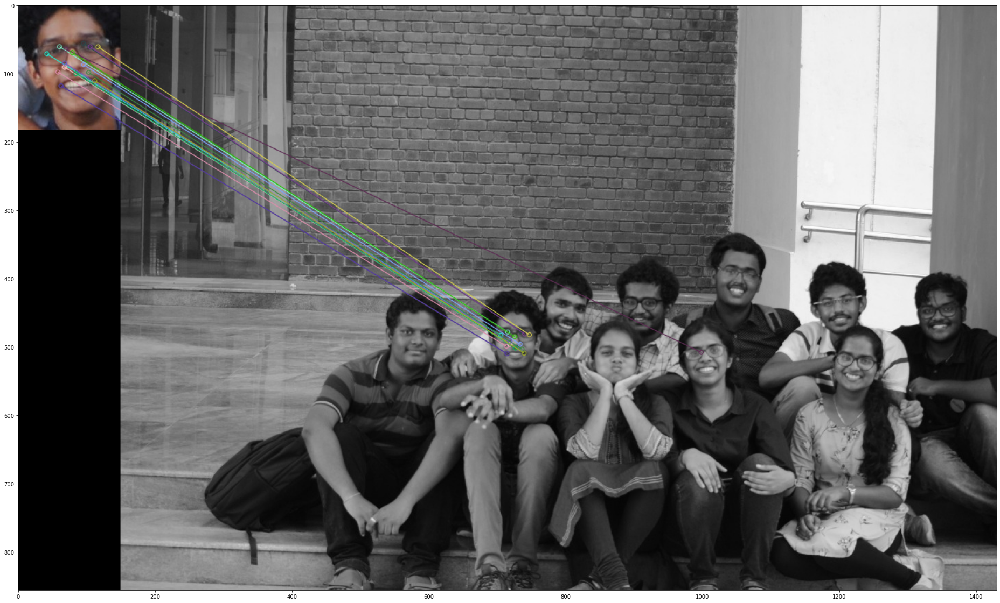

In [18]:
face_recog_sift('grp2.jpeg','subs.jpeg')

Number of Keypoints Detected In The Training Image:  86
Number of Keypoints Detected In The Query Image:  4287


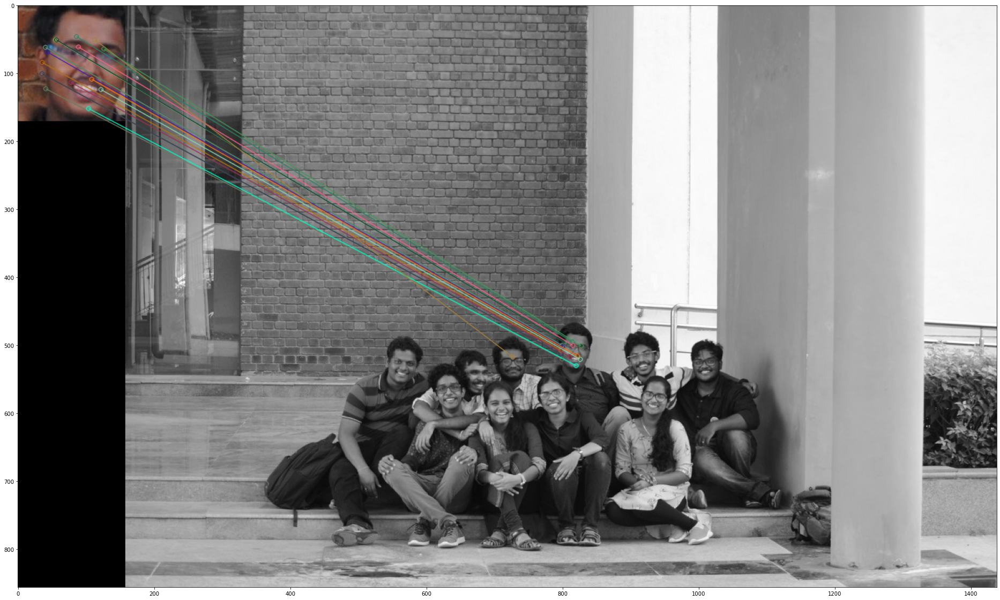

In [19]:
face_recog_sift('grp1.jpeg','harish.jpeg')

Number of Keypoints Detected In The Training Image:  86
Number of Keypoints Detected In The Query Image:  7211


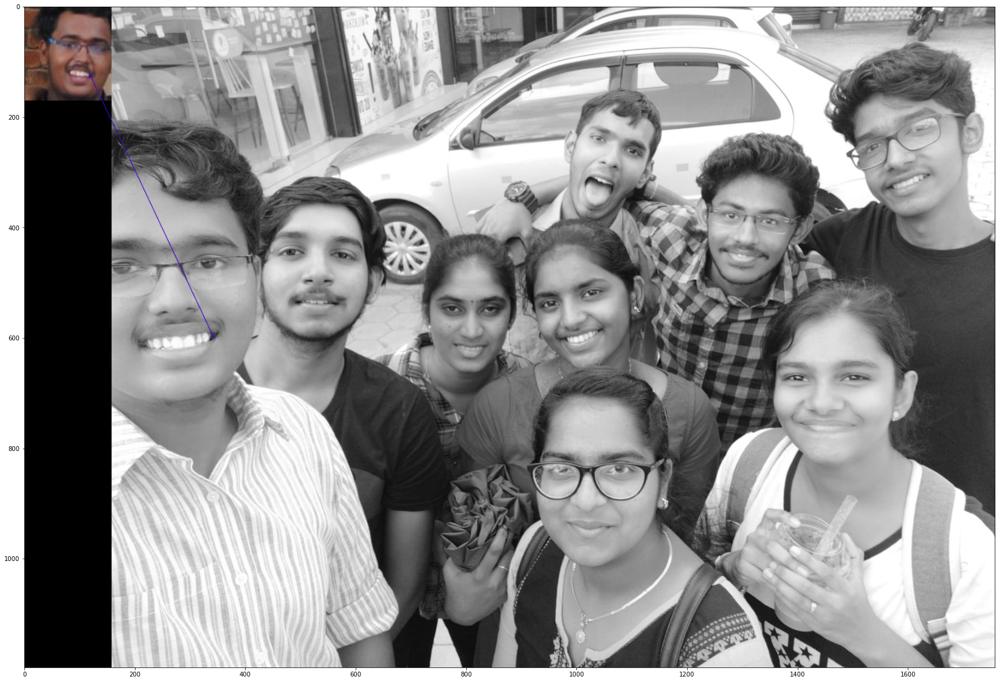

In [20]:
face_recog_sift('grp3.jpeg','harish.jpeg')

Number of Keypoints Detected In The Training Image:  1608
Number of Keypoints Detected In The Query Image:  1179


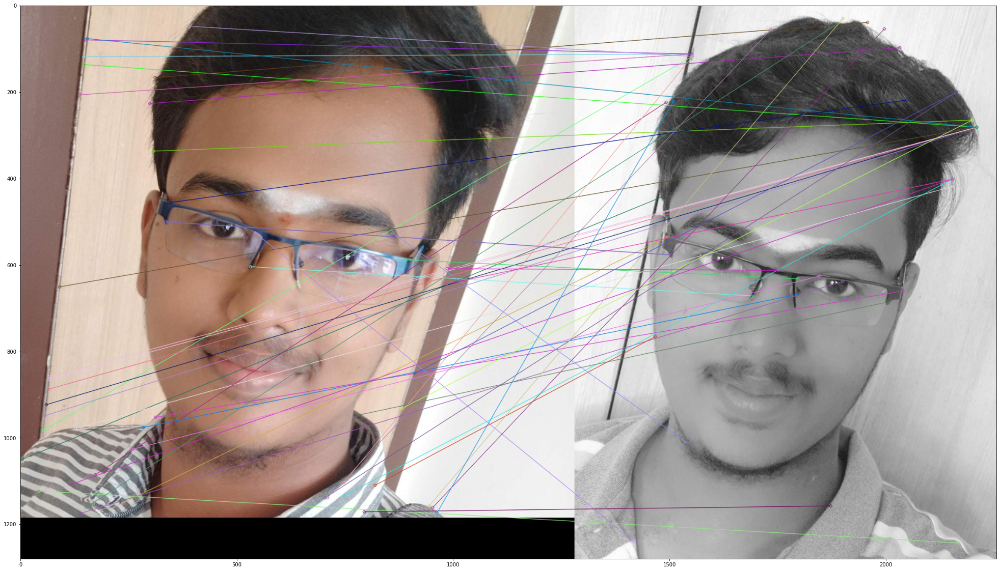

In [21]:
face_recog_sift('harish2.jpeg','harish3.jpeg')

Number of Keypoints Detected In The Training Image:  60
Number of Keypoints Detected In The Query Image:  4287


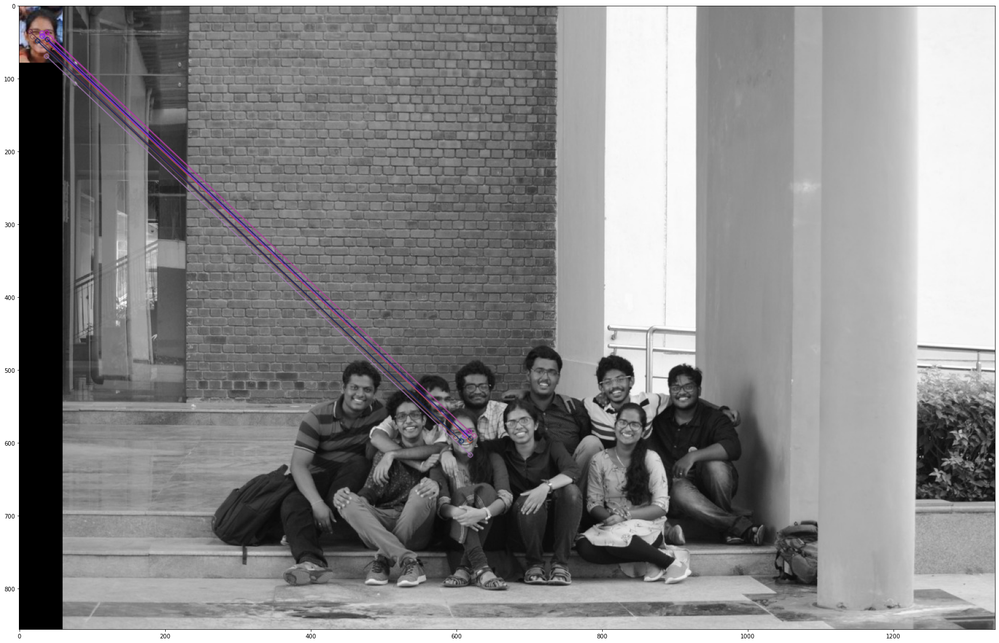

In [22]:
face_recog_sift('grp1.jpeg','sindu2.jpeg')